# Capstone Customer Churn Analysis

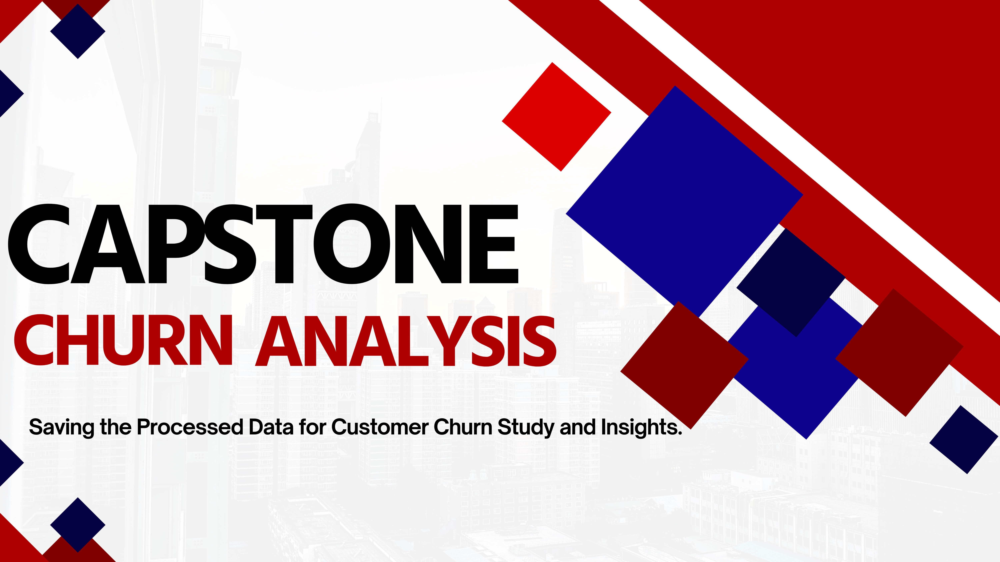

In [ ]:
from IPython.display import Image, display
display(Image(filename="Front Page.png"))

Table of Contents:

- Import Libraries
- Load the Datasets
- Basic Data Cleaning
- Exploratory Data Analysis (EDA)

--- Univariate Analysis ---
1. Count of Churn
2. Distribution of MonthlyCharges
3. Distribution of TotalCharges
4. Distribution of Tenure
5. Count of Contract Types
6. Count of Payment Methods

--- Bivariate Analysis ---
1. Churn vs Gender
2. Churn vs Internet Service
3. Churn vs Dependents
4. Churn vs Partner
5. Churn vs OnlineSecurity
6. Churn vs TechSupport

--- Multivariate Analysis ---
1. Monthly Charges vs Tenure with Churn
2. Tenure vs MonthlyCharges by Churn
3. Monthly Charges across Contract Types by Churn

--- Customer Churn Analysis ---
1. Overall Churn Rate
2. Churn Rate by Contract Type
3. Average Monthly Charges (Churn vs Non-Churn)
4. Average Tenure (Churn vs Non-Churn)
5. Churn by Contract Type
6. Churn by Contract
7. Churn by Payment Method
8. Overall Churn % Pie Chart
9. Churn Rate by Gender
10. Churn by Internet Service
11. Churn by Payment Method
12. Average Monthly Charges for Churn vs Non-Churn
13. Average Tenure for Churn vs Non-Churn
14. Customer Churn Count by Year
15. Churn rate (%) by Year

## Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

sns.set(style="whitegrid")

## Load the Datasets

In [ ]:
churn = pd.read_csv("CHURN_DATA.csv")
customer = pd.read_csv("CUSTOMER_DATA.csv")
internet = pd.read_csv("INTERNET_DATA .csv")

## Data Overview

In [ ]:
print("Churn Data:")
display(churn.head())

print("Customer Data:")
display(customer.head())

print("Internet Data:")
display(internet.head())

Churn Data:


,customerID,tenure,PhoneService,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,1,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,34,Yes,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,2,Yes,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,45,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,2,Yes,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


Customer Data:


,customerID,gender,SeniorCitizen,Partner,Dependents,Day,year,month,dob,age,Unnamed: 10,Unnamed: 11,Unnamed: 12
0,7590-VHVEG,Female,NaN,Yes,No,29,1998,1,1998-01-29,27,NaN,NaN,NaN
1,5575-GNVDE,Male,NaN,No,No,12,1983,9,1983-09-12,42,NaN,NaN,NaN
2,3668-QPYBK,Male,NaN,No,No,15,1996,5,1996-05-15,29,NaN,NaN,NaN
3,7795-CFOCW,Male,NaN,No,No,19,2001,2,2001-02-19,24,NaN,NaN,NaN
4,9237-HQITU,Female,NaN,No,No,23,1980,12,1980-12-23,44,NaN,NaN,NaN


Internet Data:


,customerID,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,No phone service,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,No,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,No,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,No phone service,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,No,Fiber optic,No,No,No,No,No,No


In [ ]:
churn.info()
customer.info()
internet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   tenure            7043 non-null   int64  
 2   PhoneService      7043 non-null   object 
 3   Contract          7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7032 non-null   float64
 8   Churn             7043 non-null   object 
dtypes: float64(2), int64(1), object(6)
memory usage: 495.3+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   customerID     7043 non-null   object 
 1   gender         7043 non-null   object 
 2   SeniorCitizen  0 non-null

## Basic Data Cleaning

In [ ]:
# Check missing values:
print("Missing Values in Churn Data:")
print(churn.isnull().sum())

print("\nMissing Values in Customer Data:")
print(customer.isnull().sum())

print("\nMissing Values in Internet Data:")
print(internet.isnull().sum())

Missing Values in Churn Data:
customerID           0
tenure               0
PhoneService         0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

Missing Values in Customer Data:
customerID          0
gender              0
SeniorCitizen    7043
Partner             0
Dependents          0
Day                 0
year                0
month               0
dtype: int64

Missing Values in Internet Data:
customerID             0
MultipleLines          0
InternetService        0
OnlineSecurity      1526
OnlineBackup        1526
DeviceProtection    1526
TechSupport         1526
StreamingTV         1526
StreamingMovies     1526
dtype: int64


In [ ]:
# Function to fill missing values:
def fill_missing_values(df):
    for col in df.columns:
        if df[col].dtype == "object":  # categorical/text column
            df[col] = df[col].fillna(df[col].mode()[0])
        else:  # numeric column
            df[col] = df[col].fillna(df[col].mean())
    return df

# Apply function on all datasets:
churn = fill_missing_values(churn)
customer = fill_missing_values(customer)
internet = fill_missing_values(internet)

In [ ]:
print("Missing Values in Churn Data:")
print(churn.isnull().sum())

print("\nMissing Values in Customer Data:")
print(customer.isnull().sum())

print("\nMissing Values in Internet Data:")
print(internet.isnull().sum())

Missing Values in Churn Data:
customerID          0
tenure              0
PhoneService        0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

Missing Values in Customer Data:
customerID          0
gender              0
SeniorCitizen    7043
Partner             0
Dependents          0
Day                 0
year                0
month               0
dtype: int64

Missing Values in Internet Data:
customerID          0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
dtype: int64


In [ ]:
# Delete the 'SeniorCitizen' column:
df2 = customer.drop(columns=["SeniorCitizen"], inplace=True)

In [ ]:
# Merge datasets using "customerID":
data = pd.merge(churn, customer, on="customerID", how="inner")
data = pd.merge(data, internet, on="customerID", how="inner")

print("Final Combined Dataset Shape:", data.shape)
display(data.head())

Final Combined Dataset Shape: (7043, 29)


,customerID,tenure,PhoneService,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,gender,...,Unnamed: 11,Unnamed: 12,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,1,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,Female,...,NaN,NaN,No phone service,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,34,Yes,One year,No,Mailed check,56.95,1889.50,No,Male,...,NaN,NaN,No,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,2,Yes,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,Male,...,NaN,NaN,No,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,45,No,One year,No,Bank transfer (automatic),42.30,1840.75,No,Male,...,NaN,NaN,No phone service,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,2,Yes,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,Female,...,NaN,NaN,No,Fiber optic,No,No,No,No,No,No


In [ ]:
# Double check missing values:
print("\nRemaining Missing Values in final data:")
print(data.isnull().sum())


Remaining Missing Values in final data:
customerID             0
tenure                 0
PhoneService           0
Contract               0
PaperlessBilling       0
PaymentMethod          0
MonthlyCharges         0
TotalCharges          11
Churn                  0
gender                 0
SeniorCitizen       7043
Partner                0
Dependents             0
Day                    0
year                   0
month                  0
dob                    0
age                    0
Unnamed: 10         7043
Unnamed: 11         7043
Unnamed: 12         7043
MultipleLines          0
InternetService        0
OnlineSecurity      1526
OnlineBackup        1526
DeviceProtection    1526
TechSupport         1526
StreamingTV         1526
StreamingMovies     1526
dtype: int64


## Exploratory Data Analysis (EDA)

###  --- Univariate Analysis ---

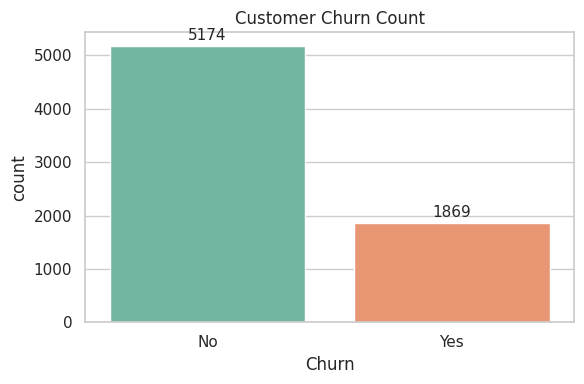

In [ ]:
# Count of Churn:
plt.figure(figsize=(6,4))
ax = sns.countplot(x="Churn", data=data, palette="Set2")

# add count labels after ax is created:
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', padding=2, fontsize=11)

ax.set_xlabel("Churn")
ax.set_title("Customer Churn Count")

plt.tight_layout()
plt.show()

Most customers did not churn; churners are a minority in the dataset.

-- The bar for “No” is much taller, indicating far more retained customers than churned ones.

-- Approximate counts show around 5.1k non-churn vs 1.9k churn, so retention is roughly 3 times higher than churn.

-- Focus areas should prioritize understanding why the 1.9k left and replicating retention factors present in the larger non-churn group.

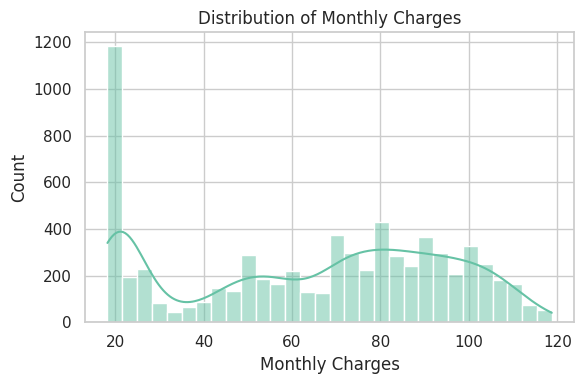

In [ ]:
# Distribution of MonthlyCharges:
color1 = sns.color_palette("Set2")[0]

plt.figure(figsize=(6,4))
sns.histplot(data["MonthlyCharges"], bins=30, kde=True, color=color1, edgecolor="white")
plt.xlabel("Monthly Charges")
plt.ylabel("Count")
plt.title("Distribution of Monthly Charges")
plt.tight_layout()
plt.show()

Most customers are clustered around lower-to-mid monthly charges, with a sharp spike near the low end around ₹20–₹25, then a broad hump between roughly ₹60–₹100.

-- The distribution is right-skewed: many low-charge customers, fewer very high-charge ones toward ₹110–₹120.

-- A prominent peak at the low-charge bin suggests a basic plan is very popular.

-- widest density lies in mid-tier charges (~₹70–₹95), indicating substantial adoption of standard packages.

-- High-charge customers exist but taper off, implying premium plans are less common.

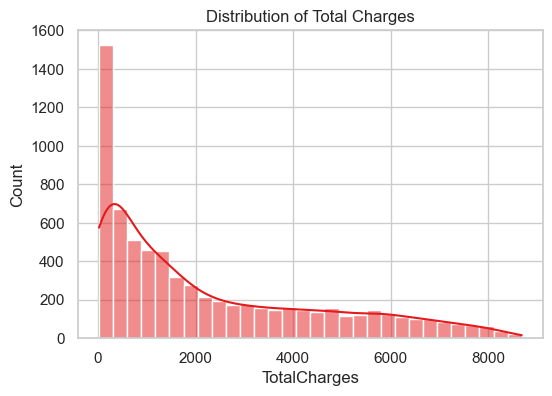

In [ ]:
# Distribution of TotalCharges:
color1 = sns.color_palette("Set1")[0]

plt.figure(figsize=(6,4))
sns.histplot(data["TotalCharges"], bins=30, kde=True, color=color1, edgecolor="white")
plt.title("Distribution of Total Charges")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

Most customers have low total charges, with counts dropping steadily as totals increase.

-- The distribution is strongly right-skewed: many customers near the lower totals, few with very high totals.

--A clear peak occurs at the smallest total charges, then a long tail extends beyond 8000, indicating a small segment of long-tenure or heavy-usage customers.

-- This suggests customer base is dominated by newer or lighter users, while high-total customers are rare but potentially high value.

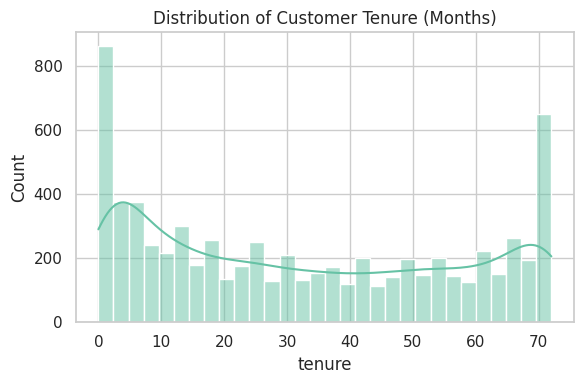

In [ ]:
# Distribution of Tenure:
color1 = sns.color_palette("Set2")[0]

plt.figure(figsize=(6,4))
sns.histplot(data["tenure"], bins=30, kde=True, color=color1, edgecolor="white")
plt.title("Distribution of Customer Tenure (Months)")
plt.tight_layout()
plt.show()

Customer tenure is concentrated at the very beginning and end of the range, with many new customers and a noticeable spike near 70–72 months.

-- The distribution is U-shaped: high counts at 0–2 months and again at long tenures, with fewer customers in the mid-tenure range.

-- Early spike suggests frequent recent acquisitions, while the late spike indicates a loyal segment staying 6+ years.

-- Mid-range dips imply higher churn risk or fewer conversions persisting through the middle months.

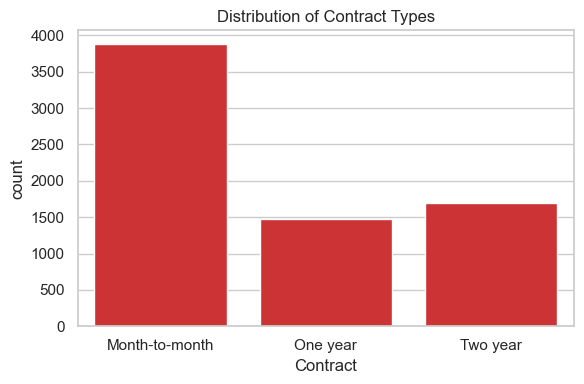

In [ ]:
# Count of Contract Types:
color1 = sns.color_palette("Set1")[0]

plt.figure(figsize=(6,4))
sns.countplot(x="Contract", data=data, color=color1, edgecolor="white")
plt.title("Distribution of Contract Types")
plt.tight_layout()
plt.show()

Most customers are on month-to-month contracts, while one-year and two-year contracts have much smaller and roughly similar counts.

-- The dominance of month-to-month suggests high flexibility preferences but also higher churn risk.

-- Long-term contracts (1–2 years) form a smaller base, indicating potential to upsell stable customers into longer commitments.

-- Retention strategies should target month-to-month users with incentives to shift into annual plans.

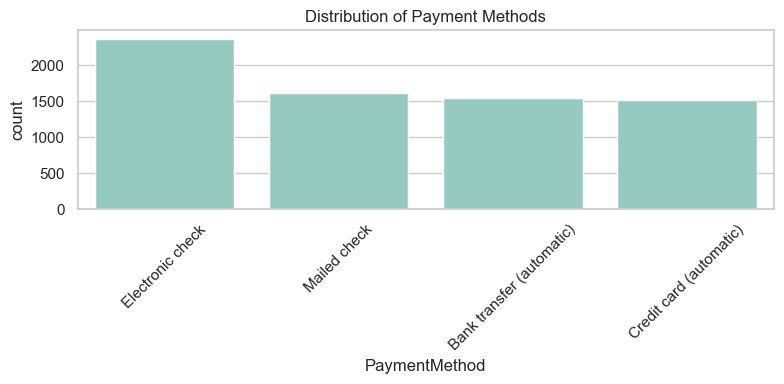

In [ ]:
# Count of Payment Methods:
color1 = sns.color_palette("Set3")[0]

plt.figure(figsize=(8,4))
sns.countplot(x="PaymentMethod", data=data, color=color1, edgecolor="white")
plt.title("Distribution of Payment Methods")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Electronic check is the most used payment method, while the three others have similar and lower adoption.

-- Electronic check leads by a clear margin, indicating strong preference for quick digital payments without cards.

-- Mailed check, bank transfer (automatic), and credit card (automatic) are each moderately used and relatively close in count.

-- Encouraging automatic methods could reduce late payments and improve retention versus manual checks.

### --- Bivariate Analysis ---

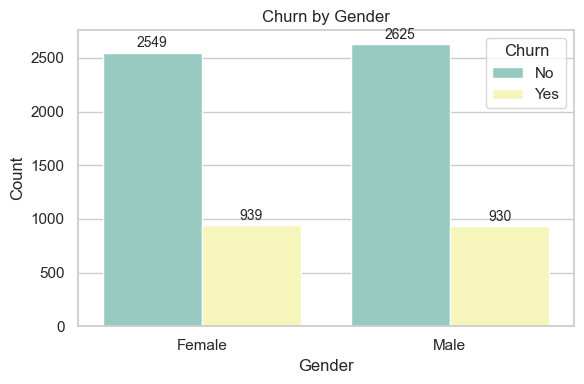

In [ ]:
# Churn vs Gender:

palette_choice = "Set3"
plt.figure(figsize=(6,4))
ax = sns.countplot(data=data, x="gender", hue="Churn", palette=palette_choice)

# Add count labels on each bar:
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=2, fontsize=10)

ax.set_xlabel("Gender")
ax.set_ylabel("Count")
ax.set_title("Churn by Gender")
plt.tight_layout()
plt.show()

Churn rates look similar for males and females, with both groups showing many more retained customers than churned ones.

-- Female: ~2549 no-churn vs ~939 churn, indicating higher retention than churn.

-- Male: ~2625 no-churn vs ~930 churn, very close to females and also retention-dominant.

-- Gender does not appear to be a strong driver of churn differences in this dataset.

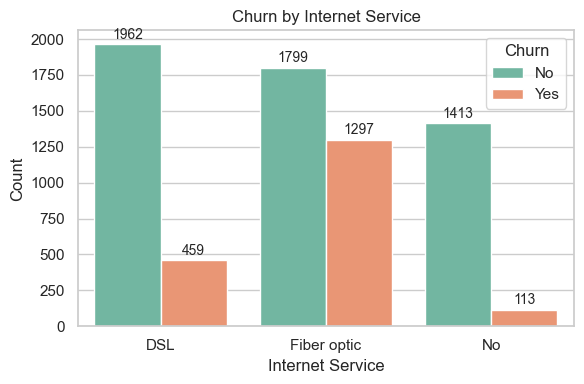

In [ ]:
# Churn vs Internet Service:
palette_choice = "Set2"
plt.figure(figsize=(6,4))
ax = sns.countplot(data=data, x="InternetService", hue="Churn", palette=palette_choice)

# Add count labels on bars:
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=2, fontsize=10)

ax.set_xlabel("Internet Service")
ax.set_ylabel("Count")
ax.set_title("Churn by Internet Service")
plt.tight_layout()
plt.show()

Fiber optic users show the highest churn counts, while DSL users churn less and non-internet users churn the least.

-- DSL: Many more retained (1962) than churned (459), indicating relatively stable customers.

-- Fiber optic: Retained (1799) and churned (1297) are closer, signaling higher churn risk in this segment.

-- No internet: Very low churn (113) with strong retention (1413), likely due to fewer service touchpoints or different product mix.

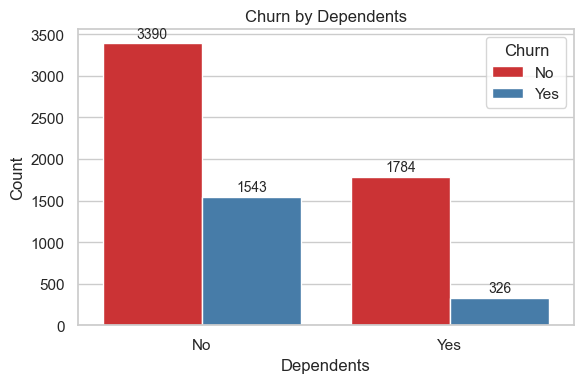

In [ ]:
# Churn vs Dependents:
palette_choice = "Set1"
plt.figure(figsize=(6,4))
ax = sns.countplot(data=data, x="Dependents", hue="Churn", palette=palette_choice)

# Add count labels on bars:
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=2, fontsize=10)

ax.set_xlabel("Dependents")
ax.set_ylabel("Count")
ax.set_title("Churn by Dependents")
plt.tight_layout()
plt.show()

Customers without dependents churn much more than those with dependents, though retention exceeds churn in both groups.

-- No dependents: ~3390 retained vs ~1543 churned, indicating higher churn pressure in this segment.

-- With dependents: ~1784 retained vs ~326 churned, showing notably lower churn.

-- Target churn reduction efforts on customers without dependents, as they are significantly more likely to leave.

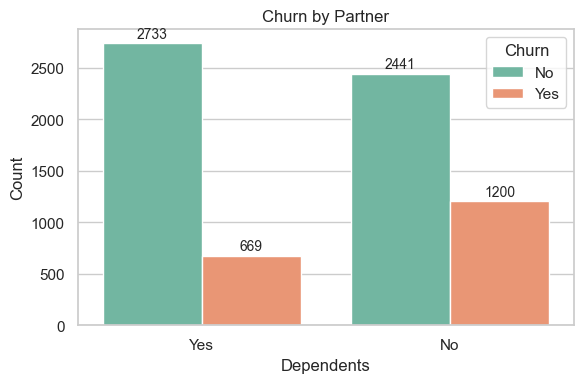

In [ ]:
# Churn vs Partner:
palette_choice = "Set2"
plt.figure(figsize=(6,4))
ax = sns.countplot(data=data, x="Partner", hue="Churn", palette=palette_choice)

# Add count labels on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=2, fontsize=10)

ax.set_xlabel("Dependents")
ax.set_ylabel("Count")
ax.set_title("Churn by Partner")
plt.tight_layout()
plt.show()

Having a partner is associated with lower churn compared to not having a partner.

-- With partner: ~2733 retained vs ~669 churned, indicating stronger stability.

-- Without partner: ~2441 retained vs ~1200 churned, showing notably higher churn levels.

-- Prioritize retention programs for customers without partners, who exhibit greater churn propensity.

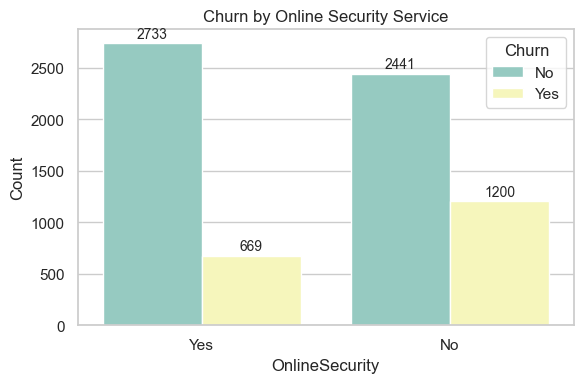

In [ ]:
# Churn vs OnlineSecurity:
palette_choice = "Set3"
plt.figure(figsize=(6,4))
ax = sns.countplot(data=data, x="Partner", hue="Churn", palette=palette_choice)

# Add count labels on bars:
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=2, fontsize=10)

ax.set_xlabel("OnlineSecurity")
ax.set_ylabel("Count")
ax.set_title("Churn by Online Security Service")
plt.tight_layout()
plt.show()

Customers with online security churn far less than those without it.

-- With security: ~2733 retained vs ~669 churned, indicating strong retention.

-- Without security: ~2441 retained vs ~1200 churned, showing markedly higher churn.

-- Promoting online security add-ons may reduce churn by shifting customers into the lower-risk group.

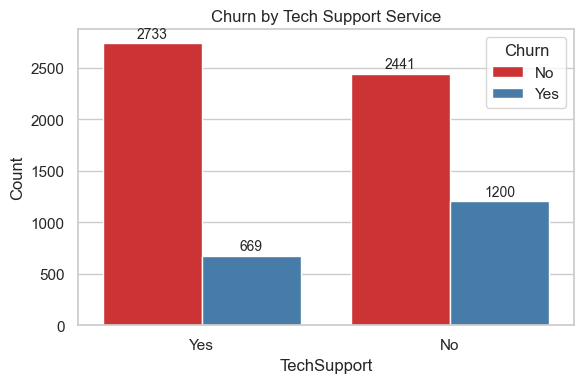

In [ ]:
# Churn vs TechSupport:
palette_choice = "Set1"
plt.figure(figsize=(6,4))
ax = sns.countplot(data=data, x="Partner", hue="Churn", palette=palette_choice)

# Add count labels on bars:
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=2, fontsize=10)

ax.set_xlabel("TechSupport")
ax.set_ylabel("Count")
ax.set_title("Churn by Tech Support Service")
plt.tight_layout()
plt.show()

Customers with tech support churn far less than those without it.

-- With tech support: ~2733 retained vs ~669 churned, indicating strong retention.

-- Without tech support: ~2441 retained vs ~1200 churned, showing significantly higher churn.

-- Offering or bundling tech support could be an effective lever to reduce churn.

### --- Multivariate Analysis ---

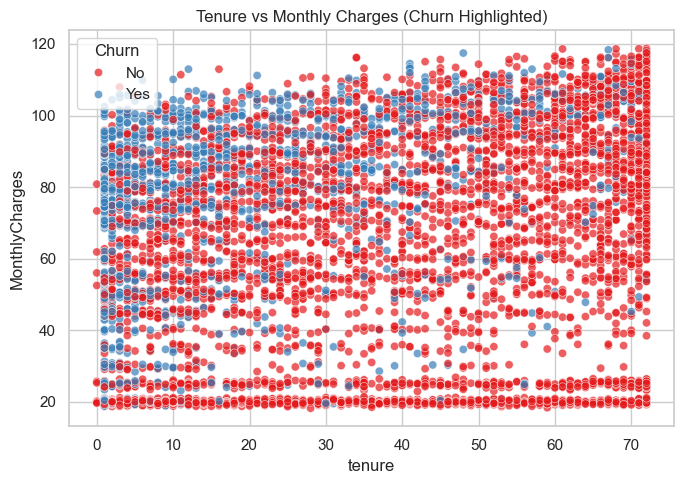

In [ ]:
# Monthly Charges vs Tenure with Churn:
plt.figure(figsize=(7,5))
sns.scatterplot(x="tenure", y="MonthlyCharges", hue="Churn", data=data, alpha=0.7, palette="Set1")
plt.title("Tenure vs Monthly Charges (Churn Highlighted)")
plt.tight_layout()
plt.show()

Churn is concentrated among newer customers with a range of monthly charges, while long-tenure customers show far fewer churn points across all charge levels.

-- Early tenure (0–12 months) has many blue churn points across both low and high charges, indicating onboarding and early value perception are critical.

-- As tenure increases, churn points thin out, suggesting retention improves substantially after the first year.

-- High monthly charges alone do not guarantee churn; long-tenure high-payers mostly stay, pointing to service satisfaction or bundled value.

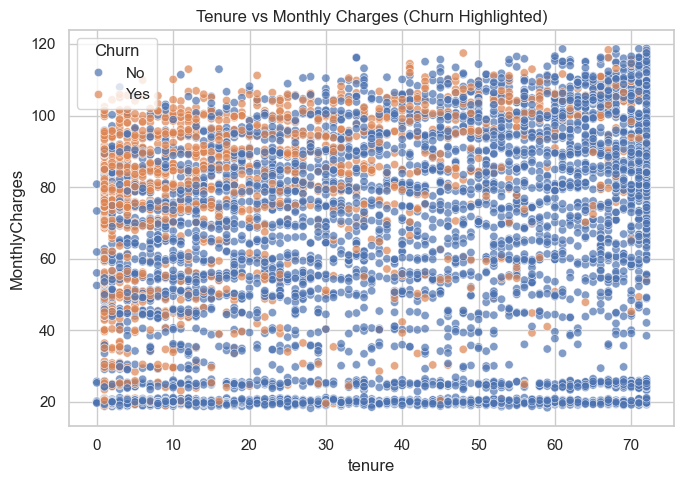

In [ ]:
# Tenure vs MonthlyCharges by Churn:
plt.figure(figsize=(7,5))
sns.scatterplot(x="tenure", y="MonthlyCharges", hue="Churn", data=data, alpha=0.7)
plt.title("Tenure vs Monthly Charges (Churn Highlighted)")
plt.tight_layout()
plt.show()

Churn is heavily concentrated in early tenure across many charge levels, while long-tenure customers are overwhelmingly non-churn.

-- In the first ~12 months, many orange churn points appear from low to high monthly charges, signaling early lifecycle risk.

-- Beyond ~24 months, churn points become sparse, indicating retention strengthens with tenure regardless of price tier.

High charges are not inherently churn-driving; most long-tenure, high-charge customers remain.

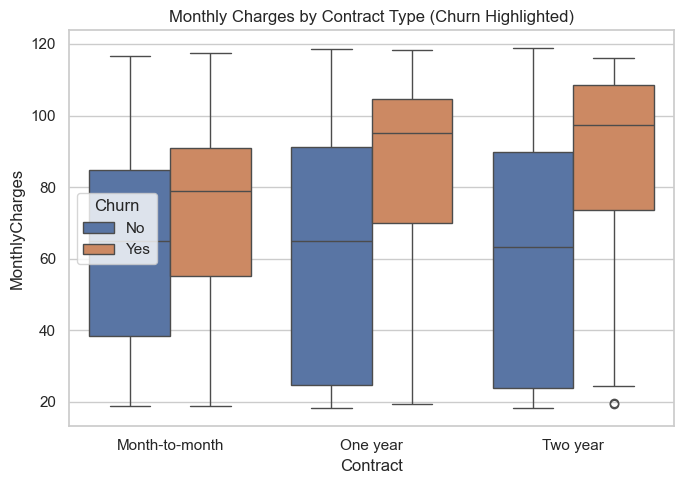

In [ ]:
# Monthly Charges across Contract Types by Churn:
plt.figure(figsize=(7,5))
sns.boxplot(x="Contract", y="MonthlyCharges", hue="Churn", data=data)
plt.title("Monthly Charges by Contract Type (Churn Highlighted)")
plt.tight_layout()
plt.show()

Churners pay higher monthly charges than non-churners across all contract types, and longer contracts tend to have higher charge levels overall.

-- Month-to-month: Churn medians sit above non-churn, with a wide spread indicating price sensitivity and variability.

-- One-year: Both groups shift higher than month-to-month, with churn still above non-churn, suggesting premium plan uptake among leavers.

-- Two-year: Highest charge levels overall; churners remain priced above non-churners, though non-churn IQR is broad, implying mixed plan tiers.

## Customer Churn Analysis

In [ ]:
# Overall Churn Rate:
churn_rate = data["Churn"].value_counts(normalize=True) * 100
print("Churn Rate (%):")
print(churn_rate)

Churn Rate (%):
Churn
No     73.463013
Yes    26.536987
Name: proportion, dtype: float64


In [ ]:
# Churn Rate by Contract Type:
contract_churn = data.groupby("Contract")["Churn"].value_counts(normalize=True).unstack() * 100
print("Churn Rate by Contract Type (%):")
print(contract_churn)

Churn Rate by Contract Type (%):
Churn                  No        Yes
Contract                            
Month-to-month  57.290323  42.709677
One year        88.730482  11.269518
Two year        97.168142   2.831858


In [ ]:
# Average Monthly Charges (Churn vs Non-Churn):
avg_charges = data.groupby("Churn")["MonthlyCharges"].mean()
print("\nAverage Monthly Charges (Churn vs Non-Churn):")
print(avg_charges)


Average Monthly Charges (Churn vs Non-Churn):
Churn
No     61.265124
Yes    74.441332
Name: MonthlyCharges, dtype: float64


In [ ]:
# Average Tenure (Churn vs Non-Churn):
avg_tenure = data.groupby("Churn")["tenure"].mean()
print("\nAverage Tenure (Churn vs Non-Churn):")
print(avg_tenure)


Average Tenure (Churn vs Non-Churn):
Churn
No     37.569965
Yes    17.979133
Name: tenure, dtype: float64


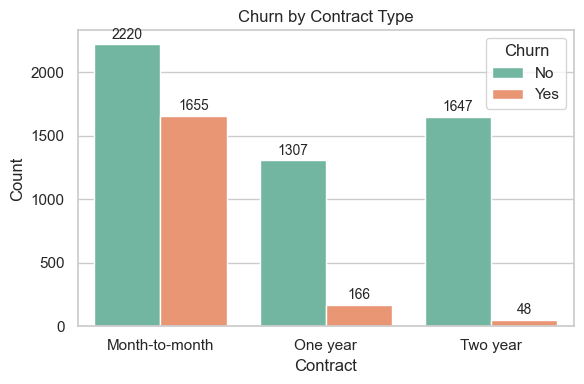

In [ ]:
# Churn by Contract Type:
palette_choice = "Set2"
plt.figure(figsize=(6,4))
ax = sns.countplot(data=data, x="Contract", hue="Churn", palette=palette_choice)

# Add count labels on bars:
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=2, fontsize=10)

ax.set_xlabel("Contract")
ax.set_ylabel("Count")
ax.set_title("Churn by Contract Type")
plt.tight_layout()
plt.show()

Month-to-month contracts have the highest churn, while one-year and two-year contracts exhibit very low churn.

-- Month-to-month: ~2220 retained vs ~1655 churned, indicating elevated risk among flexible plans.

-- One-year: ~1307 retained vs ~166 churned, showing strong retention with annual commitment.

-- Two-year: ~1647 retained vs ~48 churned, the lowest churn segment, reflecting the stabilizing effect of long-term contracts.

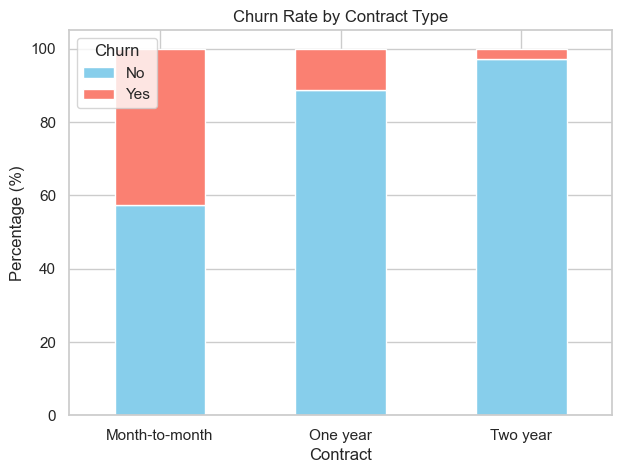

In [ ]:
# Churn by Contract:
contract_churn.plot(kind="bar", stacked=True, figsize=(7,5), color=["skyblue","salmon"])
plt.title("Churn Rate by Contract Type")
plt.ylabel("Percentage (%)")
plt.xticks(rotation=0)
plt.show()

Longer contracts have much lower churn rates, with month-to-month showing the highest percentage of churners.

-- Month-to-month: A large share of the bar is churn, indicating the riskiest contract type by percentage.

-- One-year: Churn slice is small, reflecting strong retention relative to flexible plans.

-- Two-year: Churn slice is minimal, the best retention rate among all contract types.

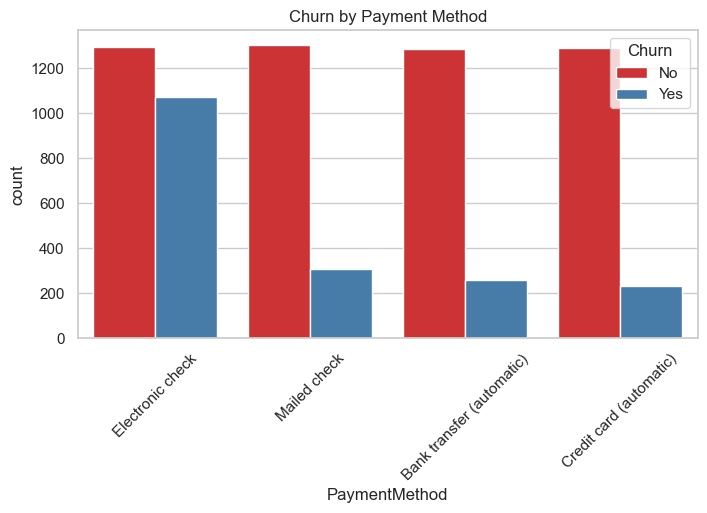

In [ ]:
# Churn by Payment Method:
plt.figure(figsize=(8,4))
sns.countplot(x="PaymentMethod", hue="Churn", data=data, palette="Set1")
plt.title("Churn by Payment Method")
plt.xticks(rotation=45)
plt.show()

Electronic check customers churn far more than those using automatic methods or mailed checks.

-- Electronic check shows a large churn bar alongside retention, marking it the riskiest payment method.

-- Mailed check and automatic bank/credit payments have much smaller churn counts relative to retained customers.

-- Encouraging automatic payments could reduce churn by decreasing friction and missed payments.

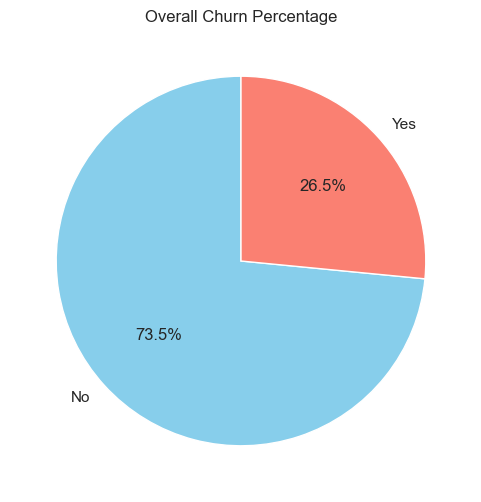

In [ ]:
# Overall Churn % Pie Chart:
plt.figure(figsize=(6,6))
data["Churn"].value_counts().plot.pie(autopct="%1.1f%%", startangle=90, colors=["skyblue","salmon"])
#explode = (0,0.2)
plt.title("Overall Churn Percentage")
plt.ylabel("")
plt.show()

Overall churn is about 26.5%, meaning roughly three-quarters of customers are retained.

-- Retained customers (No) make up around 73.5% of the base.

-- Churned customers (Yes) account for about one-quarter, indicating meaningful but manageable attrition.

-- Monitoring this rate over time and segmenting by contract, payment, and services can pinpoint improvement levers.

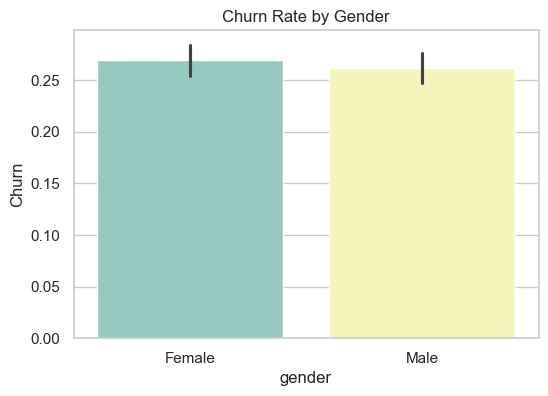

In [ ]:
# Churn Rate by Gender:
plt.figure(figsize=(6,4))
sns.barplot(x="gender", y=data["Churn"].apply(lambda x: 1 if x=="Yes" else 0), data=data, palette="Set3")
plt.title("Churn Rate by Gender")
plt.show()

Churn rates by gender are nearly identical, with only a slight, likely insignificant difference.

-- Female churn proportion is just above 0.26, very close to male.

-- Male churn proportion is just below female’s bar, and the error bars overlap, indicating no strong gap.

-- Gender is not a meaningful predictor of churn in this dataset.

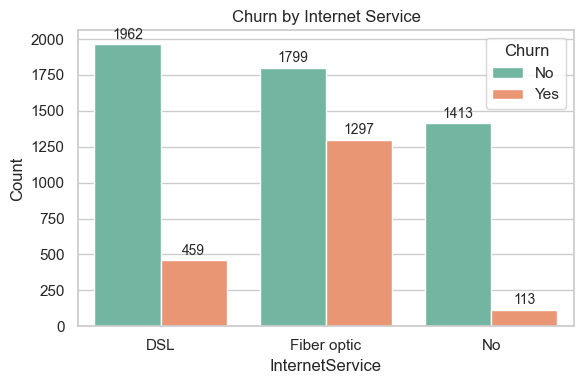

In [ ]:
# Churn by Internet Service:
palette_choice = "Set2"
plt.figure(figsize=(6,4))
ax = sns.countplot(data=data, x="InternetService", hue="Churn", palette=palette_choice)

# Add count labels on bars:
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=2, fontsize=10)

ax.set_xlabel("InternetService")
ax.set_ylabel("Count")
ax.set_title("Churn by Internet Service")
plt.tight_layout()
plt.show()

Fiber optic customers churn the most, DSL customers churn less, and customers without internet service churn the least.

-- DSL: Strong retention (1962) with comparatively low churn (459).

-- Fiber optic: Retention (1799) is close to churn (1297), indicating higher risk in this segment.

-- No internet: Highest retention (1413) with minimal churn (113), likely due to fewer service issues or a different product mix.

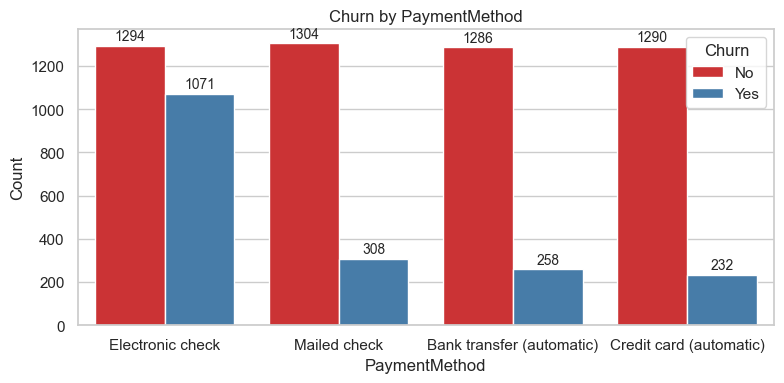

In [ ]:
# Churn by Payment Method:
palette_choice = "Set1"
plt.figure(figsize=(8,4))
ax = sns.countplot(data=data, x="PaymentMethod", hue="Churn", palette=palette_choice)

# Add count labels on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=2, fontsize=10)

ax.set_xlabel("PaymentMethod")
ax.set_ylabel("Count")
ax.set_title("Churn by PaymentMethod")
plt.tight_layout()
plt.show()

Electronic check users churn far more than users of other payment methods, while automatic bank/credit methods have the lowest churn.

-- Electronic check: High churn count (1071) close to retention (1294), marking it the riskiest segment.

-- Mailed check: Churn is much lower (308) versus retained (1304), indicating greater stability.

-- Bank transfer (auto): Low churn (258) with strong retention (1286), suggesting auto-pay improves stickiness.

-- Credit card (auto): Lowest churn (232) with high retention (1290), the safest payment group.

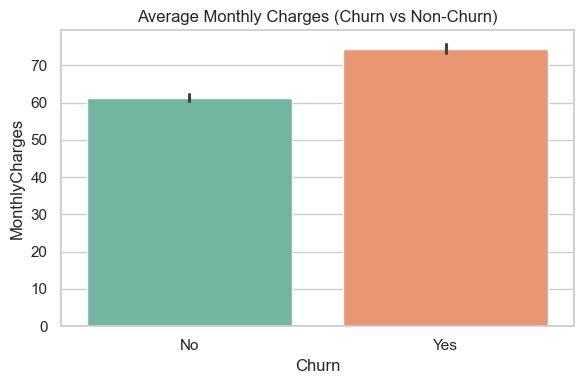

In [ ]:
# Average Monthly Charges for Churn vs Non-Churn:
plt.figure(figsize=(6,4))
sns.barplot(x="Churn", y="MonthlyCharges", data=data, palette="Set2")
plt.title("Average Monthly Charges (Churn vs Non-Churn)")
plt.tight_layout()
plt.show()

Customers who churn have higher average monthly charges than those who stay.

-- Non-churn average is around low 60s, indicating lower-cost plans correlate with retention.

-- Churn average is mid-70s, suggesting higher prices are associated with increased attrition.

-- Pricing relief or value-add bundles for high-charge segments could help reduce churn.

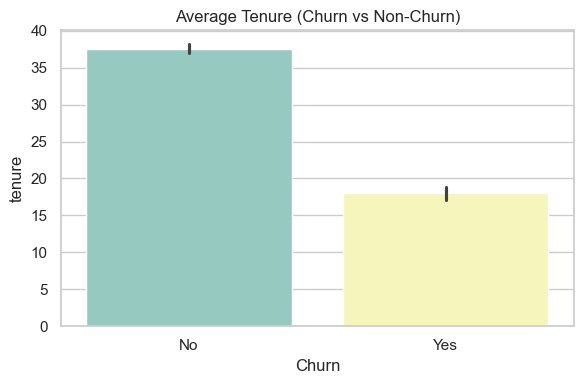

In [ ]:
# Average Tenure for Churn vs Non-Churn:
plt.figure(figsize=(6,4))
sns.barplot(x="Churn", y="tenure", data=data, palette="Set3")
plt.title("Average Tenure (Churn vs Non-Churn)")
plt.tight_layout()
plt.show()

Non-churners have much higher average tenure than churners, indicating longevity strongly aligns with retention.

-- Average tenure for retained customers is around high 30s months.

-- Average tenure for churned customers is about half that, in the high teens.

-- Early lifecycle is the critical churn window; strengthening onboarding and early value can improve survival.

In [ ]:
# Churn count by Year:
churn_year = data[data["Churn"] == "Yes"].groupby("year")["customerID"].count()

print("Churn counts by Year:")
print(churn_year)

Churn counts by Year:
year
1980    59
1981    46
1982    51
1983    41
1984    65
1985    61
1986    59
1987    46
1988    59
1989    52
1990    51
1991    68
1992    47
1993    63
1994    60
1995    60
1996    63
1997    45
1998    46
1999    55
2000    60
2001    58
2002    73
2003    46
2004    53
2005    77
2006    58
2007    57
2008    55
2009    58
2010    65
2011    47
2012    65
Name: customerID, dtype: int64


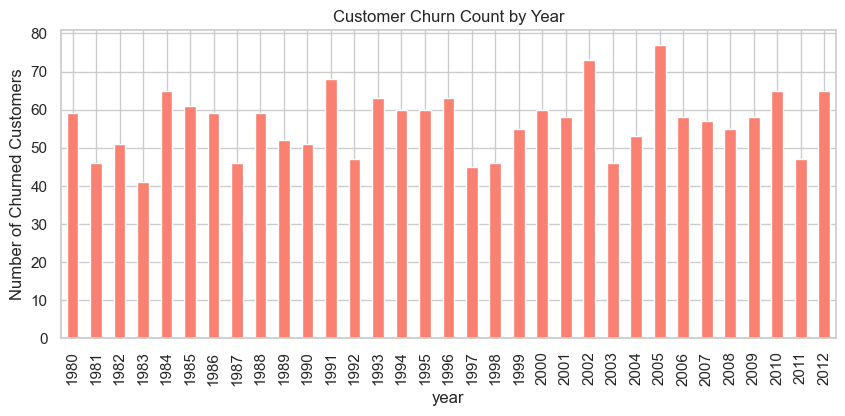

In [ ]:
# Plot churn count by Year:
churn_year.plot(kind="bar", figsize=(10,4), color="salmon")
plt.title("Customer Churn Count by Year")
plt.xlabel("year")
plt.ylabel("Number of Churned Customers")
plt.show()

Annual churn counts fluctuate between roughly 40 and 75 per year, with notable peaks around 2002 and 2005.

-- Early years (1980s–1990s) show moderate variation, mostly in the 45–65 range.

-- Spikes occur in the early 2000s, especially 2002 and 2005, indicating periods of elevated attrition.

-- Post-2005, churn remains elevated but variable, suggesting ongoing external or pricing/service factors influencing exits.

In [ ]:
# Churn rate (%) by Year:
churn_rate_year = data.groupby("year")["Churn"].value_counts(normalize=True).unstack() * 100

print("\nChurn rate (%) by Year:")
print(churn_rate_year["Yes"].round(2))


Churn rate (%) by Year:
year
1980    28.10
1981    23.00
1982    22.77
1983    21.03
1984    29.68
1985    29.05
1986    27.96
1987    20.91
1988    27.83
1989    24.19
1990    24.40
1991    31.34
1992    22.49
1993    25.93
1994    27.78
1995    28.85
1996    25.40
1997    21.74
1998    25.41
1999    25.70
2000    28.57
2001    27.23
2002    31.74
2003    25.14
2004    25.36
2005    37.02
2006    25.78
2007    26.27
2008    24.77
2009    26.98
2010    28.89
2011    24.23
2012    29.02
Name: Yes, dtype: float64


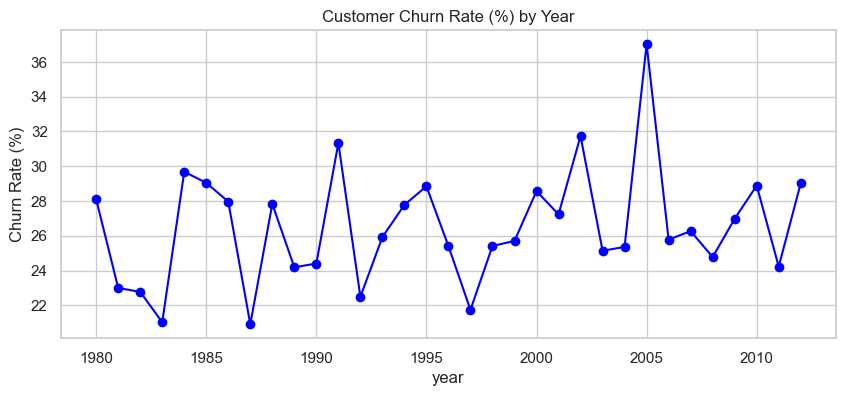

In [ ]:
# Plot churn rate by Year:
churn_rate_year["Yes"].plot(kind="line", marker="o", figsize=(10,4), color="blue")
plt.title("Customer Churn Rate (%) by Year")
plt.xlabel("year")
plt.ylabel("Churn Rate (%)")
plt.show()

Churn rate fluctuates year to year, with a prominent spike around 2005 and smaller peaks near 1991, 1995, and 2002.

-- Early 1980s saw declines from ~28% toward low 20s, followed by a jump near 1984–1985.

-- The 1990s feature oscillations between ~21% and ~31%, with local highs around 1991 and 1995.

-- Early 2000s rise to a high near 32% in 2002 and the series peaks around 37% in 2005 before easing back to mid–20s to high–20s later.

### Final Here are concise, high-impact actions to reduce churn:

📌 Push annual and two-year contracts with limited-time discounts or loyalty perks; convert month-to-month users first.

📌 Target early-tenure customers (first 12–18 months) with onboarding, check-ins, and usage nudges; this is the highest-risk window.

📌 Offer value relief for high monthly charges: bundle security/tech support, tiered discounts, or loyalty credits for high-bill segments.

📌 Promote automatic payments (bank/credit) to lower churn risk versus electronic checks; run opt-in campaigns with incentives.

📌 Cross-sell Online Security and Tech Support; subscribers to these add-ons churn less.

📌 Prioritize fiber users for proactive care and save offers; churn is highest in this internet segment.

📌 Focus retention on customers without dependents/partners; tailor pricing and perks to this higher-risk group.

📌 Monitor churn spikes over time; set alerts around known peak periods and launch preventative offers in advance.

📌 Track and report churn rate alongside tenure, contract type, payment method, and add-on adoption to guide weekly actions.

In [ ]:
data.to_csv("Final_Churn_Data.csv", index=False)

print("Final cleaned and marged dataset saved as 'Final_Churn_Data.csv'")

Final cleaned and marged dataset saved as 'Final_Churn_Data.csv'


## Thank You

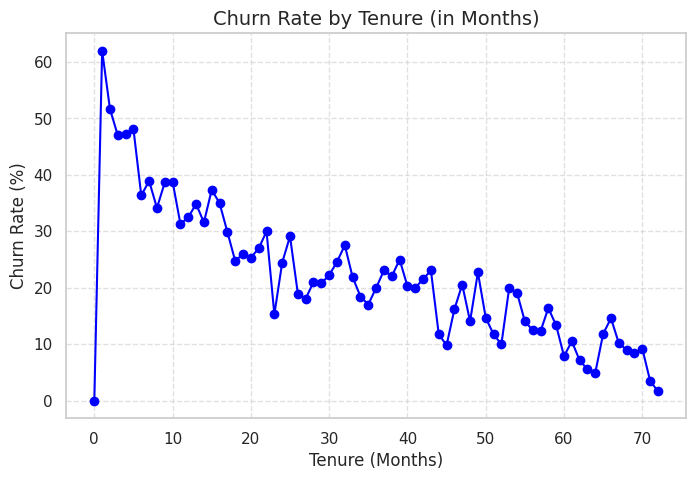

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
churn_data = pd.read_csv("/content/CHURN_DATA.csv")

# Calculate churn rate by tenure
tenure_churn = (
    churn_data.groupby("tenure")["Churn"]
    .apply(lambda x: (x == "Yes").mean() * 100)  # churn rate in %
    .reset_index(name="churn_rate")
)

# Plot
plt.figure(figsize=(8,5))
plt.plot(tenure_churn["tenure"], tenure_churn["churn_rate"], marker='o', linestyle='-', color='blue')

plt.title("Churn Rate by Tenure (in Months)", fontsize=14)
plt.xlabel("Tenure (Months)", fontsize=12)
plt.ylabel("Churn Rate (%)", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()


In [ ]:
# Calculate churn rate by tenure
tenure_churn = (
    churn_data.groupby("tenure")["Churn"]
    .apply(lambda x: (x == "Yes").mean() * 100)  # churn rate in %
    .reset_index(name="churn_rate")
)

# Plot
plt.figure(figsize=(12,6))
plt.plot(tenure_churn["tenure"], tenure_churn["churn_rate"], marker='o', linestyle='-', color='blue')

plt.title("Churn Rate by Tenure (in Months)", fontsize=14)
plt.xlabel("Tenure (Months)", fontsize=12)
plt.ylabel("Churn Rate (%)", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

NameError: name 'churn_data' is not defined